<a href="https://colab.research.google.com/github/SummerSnow-flake/NS/blob/main/week09/regularize_CNN_from_scratch_flowers_3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 🌸 Convolutional Neural Network – Classifying Images from the Oxford Flowers Dataset

Data: [Oxford 102 Category Flower Dataset](https://www.robots.ox.ac.uk/~vgg/data/flowers/102/)

🌸 The Oxford Flowers dataset is a collection of color images of flowers commonly found in the United Kingdom. It contains **8189** images grouped into **102** categories, with class labels and a standard split into training, validation, and test sets. The images vary in scale, pose, and lighting conditions, making the dataset a rich and challenging benchmark for image classification tasks.

In this notebook, we will focus on a selected subset of classes (e.g., daffodil, snowdrop, and tulip) to build a multi-class image classifier using Convolutional Neural Networks (CNNs) with Keras and TensorFlow.

The dataset provides an excellent example of multi-class classification using images that are visually similar yet distinct enough to allow for effective learning using CNNs.

The full dataset can be downloaded from:

    🌐 https://www.robots.ox.ac.uk/~vgg/data/flowers/102/

We will work with **the whole dataset of 102 classes or with a smaller dataset containing just three classes** depending on the setting of the parameter `all_classes`.

In [1]:
all_classes = False

# 1. Process the data

## Download the dataset
1. Downloads the flower image archive as 102flowers.tgz, containing all flower images.
2. Extracts the images into a folder called images.
3. Downloads the image labels in the file imagelabels.mat (MATLAB format).
4. Optionally: Downloads the dataset split indices in the file setid.mat, which tells you which images belong to training, validation, and test sets.

In [2]:
import os
import tarfile
import requests

url = "https://www.robots.ox.ac.uk/~vgg/data/flowers/102/102flowers.tgz" # url of the dataset
images_folder = "images" # folder for the dataset

zip_path = "102flowers.tgz"
# Utility function for downloading files
def download_file(url, filename):
    if not os.path.exists(filename):
        print(f"Downloading {filename}...")
        response = requests.get(url, stream=True)
        with open(filename, 'wb') as f:
            for chunk in response.iter_content(chunk_size=8192):
                f.write(chunk)
    else:
        print(f"{filename} already exists.")

# Download image archive
download_file( url, zip_path)

# Extract images if not already extracted
if not os.path.exists(images_folder):
    print("Extracting image archive into:", images_folder)
    os.makedirs(images_folder, exist_ok=True)
    with tarfile.open(zip_path) as tar:
        tar.extractall(path=images_folder)
else:
    print("Target folder already exists.")

# Download annotations
download_file("https://www.robots.ox.ac.uk/~vgg/data/flowers/102/imagelabels.mat", "imagelabels.mat")
#download_file("https://www.robots.ox.ac.uk/~vgg/data/flowers/102/setid.mat", "setid.mat")

# Clean up by removing the downloaded tgz file
#os.remove(zip_path)

Extracting image archive into: images


/tmp/ipykernel_501/3479314855.py:28: DeprecationWarning: Python 3.14 will, by default, filter extracted tar archives and reject files or modify their metadata. Use the filter argument to control this behavior.
  tar.extractall(path=images_folder)


#### Extracting a zip file instead of tgz:

In [3]:
import zipfile
import os

zip_path = "dataset.zip" # path to the zip file
output_folder = "images_from_zip"

if os.path.exists(zip_path):
  # Extract the zip file
  with zipfile.ZipFile(zip_path, "r") as zip_ref:
      zip_ref.extractall(output_folder)
  # Clean up by removing the downloaded zip file
  os.remove(zip_path)
else:
    print(f"{zip_path} doesn't exists.")



dataset.zip doesn't exists.


### Load Labels and Define Target Classes
The labels are stored in a file in MATLAB format (.mat), we have to extract them

The file imagelabels.mat contains a single variable named **labels**, which is a 1D array of length 8,189. Each element corresponds to the class label (from 1 to 102) for a flower image in the dataset.

In [4]:
import scipy.io
import numpy as np

# Load the .mat file
labels_data = scipy.io.loadmat("imagelabels.mat")

# Check the keys inside the loaded dictionary
print(labels_data.keys())

labels = labels_data['labels'][0]

print(f"Number of labels: {len(labels)}")
print(f"Label for image_00001.jpg: {labels[0]}")
print(f"Label for image_08189.jpg: {labels[-1]}")

dict_keys(['__header__', '__version__', '__globals__', 'labels'])
Number of labels: 8189
Label for image_00001.jpg: 77
Label for image_08189.jpg: 62


- Select just three classes to work with (e.g., Petunia, Pansy, Rose)

In [5]:
# Define the class labels we want to keep (Daffodil, Snowdrop, Tulip)
# Note: class IDs in the dataset start from 1
selected_classes = {
    51: "petunia",
    46: "wallflower",  # fiala sivá
    73: "waterlilly" # leknín
}

from collections import Counter

# Count all labels in the dataset
label_counts = Counter(labels)

# Print counts for selected classes
for label, name in selected_classes.items():
    print(f"{name} (label {label}): {label_counts[label]} images total")

base_folder ="flowers_subset/"
num_classes = len(selected_classes)

petunia (label 51): 258 images total
wallflower (label 46): 196 images total
waterlilly (label 73): 194 images total


- set all_classes to True to use all classes for classification

In [6]:
if all_classes:
    selected_classes = { }
    for i in range(1,103):
        selected_classes[i] = str(i)
    from collections import Counter

    # Count all labels in the dataset
    label_counts = Counter(labels)

    # Print counts for selected classes
    for label, name in selected_classes.items():
        print(f"{name} (label {label}): {label_counts[label]} images total")
    base_folder ="flowers_all/"
    num_classes = len(selected_classes)


In [7]:
# Print sorted counts for all 102 classes
print_all = False

if print_all:
  print("📊 Number of images per class:\n")
  for label_id in sorted(label_counts.keys()):
      count = label_counts[label_id]
      #if count > 180:
      print(f"Class {label_id:>3}: {count:>4} images")

## Organize Images into the Required Folder Structure

### The required folder structure for image classification in Keras, TensorFlow and Pytorch
- The **root folder** should contain **three subdirectories**: `train`, `validation`, and `test`. The folders represent the essential division of the dataset into training, validation, and testing sets.
- Within each of these directories, images for separate classes are stored in **separate subfolders**. The name of each subfolder will be automatically used as the **class label**.

- This folder structure is required by Keras, TensorFlow, and PyTorch image loaders:
 - Keras functions such as `image_dataset_from_directory(directory)` or `flow_from_directory()`
  - PyTorch datasets such as `torchvision.datasets.ImageFolder`


### Filter and Copy Selected Images into Class Folders
- Randomly split the dataset into three subsets: train, validation, and test, according to a specified ratio (default: 70% / 15% / 15%).
- Create a new folder structure where each class has its own subfolder in each subset, which is compatible with Keras, TensorFlow, and PyTorch image loaders:

```
flowers_subset/
├── train/
│   ├── petunia/
│   ├── waterlilly/
│   └── wallflower/
├── validation/
│   ├── petunia/
│   ├── waterlilly/
│   └── wallflower/
└── test/
    ├── petunia/
    ├── waterlilly/
    └── wallflower/

```




In [8]:
import os
import shutil
import random
from collections import defaultdict

def split_and_organize_data(labels, selected_classes, image_dir='jpg', output_dir=base_folder,
                             split_ratio=(0.7, 0.15, 0.15), seed=42):
    random.seed(seed)
    label_to_indices = defaultdict(list)

    # Step 1: Group image indices by class
    for idx, label in enumerate(labels, start=1):  # Labels start at 1
        if label in selected_classes:
            label_to_indices[label].append(idx)

    # Step 2: Split and copy images
    for label, indices in label_to_indices.items():
        flower_name = selected_classes[label]
        random.shuffle(indices)

        n = len(indices)
        n_train = int(split_ratio[0] * n)
        n_val = int(split_ratio[1] * n)
        n_test = n - n_train - n_val

        splits = {
            'train': indices[:n_train],
            'validation': indices[n_train:n_train + n_val],
            'test': indices[n_train + n_val:]
        }

        print(f"\nClass '{flower_name}' ({n} images):")
        for split_name, split_indices in splits.items():
            split_path = os.path.join(output_dir, split_name, flower_name)
            os.makedirs(split_path, exist_ok=True)

            for idx in split_indices:
                image_name = f'image_{idx:05d}.jpg'
                src = os.path.join(image_dir, image_name)
                dst = os.path.join(split_path, image_name)
                shutil.copy(src, dst)

            print(f"  {split_name:<10}: {len(split_indices)} images")


split_and_organize_data(labels, selected_classes, image_dir = images_folder + "/jpg", output_dir = base_folder)



Class 'waterlilly' (194 images):
  train     : 135 images
  validation: 29 images
  test      : 30 images

Class 'wallflower' (196 images):
  train     : 137 images
  validation: 29 images
  test      : 30 images

Class 'petunia' (258 images):
  train     : 180 images
  validation: 38 images
  test      : 40 images


### Vizualize the data:

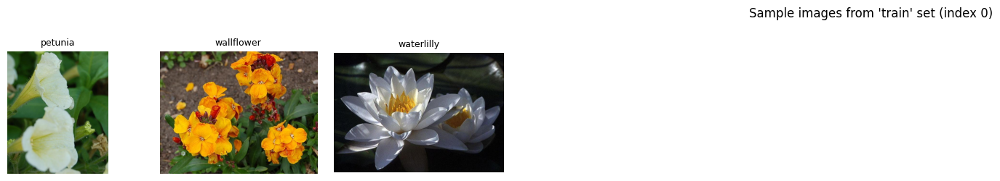

In [9]:
import os
import matplotlib.pyplot as plt
from PIL import Image
import math

def show_sample_images_by_index(base_dir, class_names, split="train", index=0, images_per_row=10):
    """
    Displays one image per class from the specified dataset split, arranged in rows.

    Parameters:
    - base_dir: root folder with subfolders 'train', 'validation', 'test'
    - class_names: list or dict of class folder names
    - split: which split to use ('train', 'validation', 'test')
    - index: which image to show per class (0 = first image)
    - images_per_row: how many images to display per row
    """
    num_classes = len(class_names)
    rows = math.ceil(num_classes / images_per_row)

    plt.figure(figsize=(images_per_row * 2.5, rows * 2.5))

    for i, class_name in enumerate(class_names):
        class_folder = os.path.join(base_dir, split, class_name)
        image_files = sorted(os.listdir(class_folder))

        if index >= len(image_files):
            print(f"⚠️ Not enough images in class '{class_name}'")
            continue

        image_path = os.path.join(class_folder, image_files[index])
        image = Image.open(image_path)

        plt.subplot(rows, images_per_row, i + 1)
        plt.imshow(image)
        plt.title(class_name, fontsize=9)
        plt.axis('off')

    plt.suptitle(f"Sample images from '{split}' set (index {index})")
    plt.tight_layout()
    plt.show()


# Show first image from each class in the training set
show_sample_images_by_index(base_folder,  list(selected_classes.values()), split="train", index=0)

# Loading the Bees vs. Ants Dataset

The Bees vs. Spiders dataset is a collection of images for binary image classification. It contains a training set of labeled images of bees and ants. Each image is a color photograph. The dataset represents a visually diverse classification problem, as the two categories differ in structure, texture, and typical background, making it suitable for experimenting with convolutional neural networks.

The dataset is available at:
https://download.pytorch.org/tutorial/hymenoptera_data.zip

In [10]:
import os
import zipfile
import urllib.request

# target directory
data_dir = "data"
os.makedirs(data_dir, exist_ok=True)

# dataset URL
url = "https://download.pytorch.org/tutorial/hymenoptera_data.zip"
zip_path = os.path.join(data_dir, "ants_bees.zip")

# download
if not os.path.exists(zip_path):
    print("Downloading dataset...")
    urllib.request.urlretrieve(url, zip_path)
    print("Download complete.")

# unzip
extract_path = os.path.join(data_dir, "ants_bees")

if not os.path.exists(extract_path):
    print("Extracting dataset...")
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall(data_dir)
    print("Extraction complete.")

print("Dataset ready at:", os.path.join(data_dir, "hymenoptera_data"))

Download complete.
Extracting dataset...
Extraction complete.
Dataset ready at: data/hymenoptera_data


## Process the data

### The format (structure) of the folder with data:
- in our case, the root folder contains three subdirectories: train, validation, and test:
in our case, the root folder contains three subdirectories: `train` (2000 images), `validation` (1000 images), and `test` (2000 images):

```
data/
└── hymenoptera_data/
    ├── train/
    │   ├── ants/
    │   └── bees/
    └── val/
        ├── ants/
        └── bees/
```

Observe the number of images in each folder:


In [11]:
import os

base_folder = "data/hymenoptera_data"

for split in ["train", "val"]:
    split_dir = os.path.join(base_folder, split)
    print(f"\n{split.upper()}:")
    for category in ["ants", "bees"]:
        category_dir = os.path.join(split_dir, category)
        num_images = len(os.listdir(category_dir))
        print(f"  {category}: {num_images} images")


TRAIN:
  ants: 124 images
  bees: 121 images

VAL:
  ants: 70 images
  bees: 83 images


Split the validation set into validation and test

In [12]:
import os
import shutil
import random

# set seed for reproducibility
random.seed(42)

base_folder = "data/hymenoptera_data"
val_dir = os.path.join(base_folder, "val")

validation_dir = os.path.join(base_folder, "validation")
test_dir = os.path.join(base_folder, "test")

# create target directories
for split_dir in [validation_dir, test_dir]:
    for cls in ["ants", "bees"]:
        os.makedirs(os.path.join(split_dir, cls), exist_ok=True)

# split data into validation and test
for cls in ["ants", "bees"]:
    src_dir = os.path.join(val_dir, cls)
    images = os.listdir(src_dir)

    # shuffle images randomly
    random.shuffle(images)

    # split 50/50
    split_idx = len(images) // 2
    val_images = images[:split_idx]
    test_images = images[split_idx:]

    # copy images to validation set
    for img in val_images:
        shutil.copy(
            os.path.join(src_dir, img),
            os.path.join(validation_dir, cls, img)
        )

    # copy images to test set
    for img in test_images:
        shutil.copy(
            os.path.join(src_dir, img),
            os.path.join(test_dir, cls, img)
        )

# remove original val directory
shutil.rmtree(val_dir)

print("Done. Validation and test sets created, original 'val' removed.")



Done. Validation and test sets created, original 'val' removed.


In [13]:
import os

base_folder = "data/hymenoptera_data"

for split in ["train", "validation", "test"]:
    split_dir = os.path.join(base_folder, split)
    print(f"\n{split.upper()}:")
    for category in ["ants", "bees"]:
        category_dir = os.path.join(split_dir, category)
        num_images = len(os.listdir(category_dir))
        print(f"  {category}: {num_images} images")


TRAIN:
  ants: 124 images
  bees: 121 images

VALIDATION:
  ants: 35 images
  bees: 41 images

TEST:
  ants: 35 images
  bees: 42 images


Observe some images:

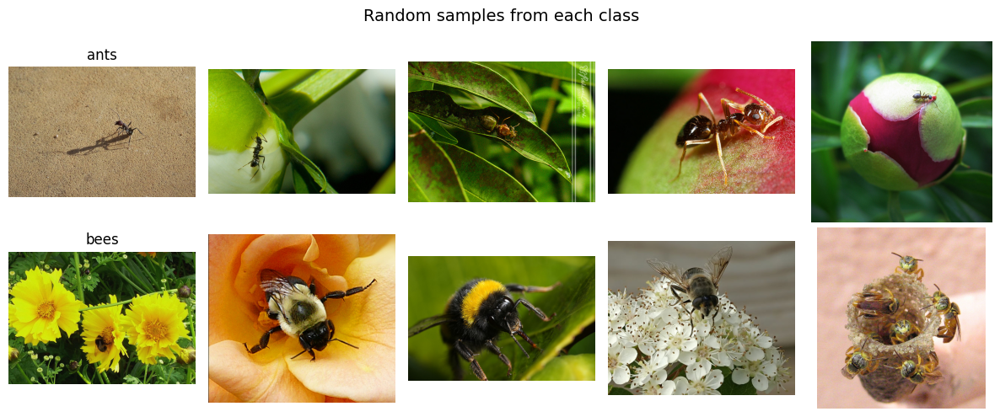

In [14]:
import os
import random
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

base_folder = "data/hymenoptera_data/train"
classes = ["ants", "bees"]

fig, axes = plt.subplots(len(classes), 5, figsize=(12, 5))
fig.suptitle("Random samples from each class", fontsize=14)

for i, cls in enumerate(classes):
    class_dir = os.path.join(base_folder, cls)
    images = random.sample(os.listdir(class_dir), 5)

    for j, img_name in enumerate(images):
        img_path = os.path.join(class_dir, img_name)
        img = mpimg.imread(img_path)
        axes[i, j].imshow(img)
        axes[i, j].axis("off")
        if j == 0:
            axes[i, j].set_title(cls)

plt.tight_layout()
plt.show()

## Create Dataset Loaders (or) Load the Data

### Create Datasets from folders
- **`image_dataset_from_directory(directory)`**:
 - available in Keras with TensorFlow backend only – not compatible with PyTorch)
  1. Assumes the folder structure follows the format: class-specific subfolders within `train`, `validation`, and `test` directories.
  2. Scans and indexes image files in each subdirectory, automatically assigning labels based on folder names.
  3. Returns a `tf.data.Dataset` object that:
     - Loads and shuffles the files,
     - Decodes images into tensors,
     - Resizes images to a consistent size,
     - Batches images for efficient model training and evaluation.


https://keras.io/api/data_loading/image/

In [15]:
base_folder = "data/hymenoptera_data/"

In [16]:
batch_size = 32
image_size = (180, 180)

from keras.utils import image_dataset_from_directory

train_dataset = image_dataset_from_directory(
    base_folder + "train",
    image_size=image_size,
    seed=42,
    batch_size=batch_size)
validation_dataset = image_dataset_from_directory(
    base_folder  + "validation",
    image_size=image_size,
    seed=42,
    batch_size=batch_size)
test_dataset = image_dataset_from_directory(
    base_folder  + "test",
    image_size=image_size,
    shuffle = False,
    seed=42,
    batch_size=batch_size)



Found 245 files belonging to 2 classes.
Found 76 files belonging to 2 classes.
Found 77 files belonging to 2 classes.


In [17]:
from google.colab import drive
drive.mount('/content/drive')

MessageError: Error: credential propagation was unsuccessful

- `tf.data.Dataset` is an iterator:

In [18]:
for data_batch, labels_batch in train_dataset:
    print("data batch shape:", data_batch.shape)
    print("labels batch shape:", labels_batch.shape)
    break
for data_batch, labels_batch in validation_dataset:
    print("data batch shape:", data_batch.shape)
    print("labels batch shape:", labels_batch.shape)
    break

data batch shape: (32, 180, 180, 3)
labels batch shape: (32,)
data batch shape: (32, 180, 180, 3)
labels batch shape: (32,)


### More about tf.data.Dataset:

In [19]:
# Another example of a dataset:
import numpy as np
import tensorflow as tf
random_numbers = np.random.normal(size=(1000, 16))
dataset = tf.data.Dataset.from_tensor_slices(random_numbers)

# iteration over examples:
for i, element in enumerate(dataset):
    print(element.shape)
    if i >= 2:
        break

# iteration over batches:
batched_dataset = dataset.batch(32)
for i, element in enumerate(batched_dataset):
    print(element.shape)
    if i >= 2:
        break

# iteration over batches with map:
reshaped_dataset = dataset.map(lambda x: tf.reshape(x, (4, 4)))
for i, element in enumerate(reshaped_dataset):
    print(element.shape)
    if i >= 2:
        break

(16,)
(16,)
(16,)
(32, 16)
(32, 16)
(32, 16)
(4, 4)
(4, 4)
(4, 4)


## Define and train the model



### Simple CNN model for multiclass classification:
- Start with a keras.Input layer specifying the input shape, e.g., 180x180x3.
- Add Rescaling Layer to normalize the pixels
- Add multiple blocks of Conv2D (with 'relu' activation) followed by MaxPooling2D to progressively extract spatial features.
- Then add a Flatten layer to convert 2D feature maps to 1D vector.
- Optionally, include one or more Dense layers with 'relu' (or 'tanh') activations for further feature extraction.
- Use 'softmax' activation function in the output layer for multiclass classification.




#### Define the Model Using Sequential API

In [26]:
import keras
from keras import layers
num_classes = len(selected_classes)


# Define the model architecture using Sequential API
model = keras.Sequential([

    # Input layer and normalization
    layers.Input(shape=image_size + (3,)),                 # Input shape, e.g. (180, 180, 3)
    layers.Rescaling(1./255),                              # Normalize pixel values to [0, 1]

    # Convolutional blocks
    layers.Conv2D(filters=32, kernel_size=3, activation="relu"),
    layers.MaxPooling2D(pool_size=2),

    layers.Conv2D(filters=64, kernel_size=3, activation="relu"),
    layers.MaxPooling2D(pool_size=2),

    layers.Conv2D(filters=128, kernel_size=3, activation="relu"),
    layers.MaxPooling2D(pool_size=2),

    # layers.Conv2D(filters=256, kernel_size=3, activation="relu"),  # optional


    layers.Flatten(),                                               # Flatten to 1D

    # Dense layers
    layers.Dense(64, activation='relu'),
    #layers.Dropout(0.3),

    # Output layer for 102-class classification
    layers.Dense(num_classes, activation="sigmoid")
])

# Print model summary
model.summary()


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling_3 (Rescaling)         │ (None, 180, 180, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 178, 178, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_9 (MaxPooling2D)  │ (None, 89, 89, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, 87, 87, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_10 (MaxPooling2D) │ (None, 43, 43, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 41, 41, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_11 (MaxPooling2D) │ (None, 20, 20, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_3 (Flatten)             │ (None, 51200)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 64)             │     3,276,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 3)              │           195 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,370,307 (12.86 MB)

 Trainable params: 3,370,307 (12.86 MB)

 Non-trainable params: 0 (0.00 B)

#### Define the same model using the functional API

In [21]:
import keras
from keras import layers
def get_model():
    # Define the model architecture
    inputs = keras.Input(shape=image_size + (3, ))

    # Normalize pixels
    x = layers.Rescaling(1./255)(inputs)

    # Convolutional blocks
    x = layers.Conv2D(filters=32, kernel_size=3, activation="relu")(x)
    x = layers.MaxPooling2D(pool_size=2)(x)

    x = layers.Conv2D(filters=64, kernel_size=3, activation="relu")(x)
    x = layers.MaxPooling2D(pool_size=2)(x)

    x = layers.Conv2D(filters=128, kernel_size=3, activation="relu")(x)
    x = layers.MaxPooling2D(pool_size=2)(x)

    #x = layers.Conv2D(filters=256, kernel_size=3, activation="relu")(x)

    x = layers.Flatten()(x)

    # Dense layers
    x = layers.Dense(64, activation='relu')(x)
    #x = layers.Dropout(0.3)(x)

    # Output layer for 3-class classification
    outputs = layers.Dense(num_classes, activation="sigmoid")(x)

    # Build model
    model = keras.Model(inputs=inputs, outputs=outputs)
    return model

model = get_model()
model.summary()


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 180, 180, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling_1 (Rescaling)         │ (None, 180, 180, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 178, 178, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 89, 89, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 87, 87, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 43, 43, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 41, 41, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 20, 20, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 51200)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 64)             │     3,276,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 3)              │           195 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,370,307 (12.86 MB)

 Trainable params: 3,370,307 (12.86 MB)

 Non-trainable params: 0 (0.00 B)

In [27]:
# Data frame for results
import pandas as pd

columns = ["Model Name", "Test Accuracy", "Test Loss", "Train Accuracy", "Train Loss", "Time (s)", "Epochs", "Details"]
results_df = pd.DataFrame(columns=columns)

In [28]:
# plot the training progress:
def plot_history(history):
    history_dict = history.history
    print(history_dict.keys())

    from matplotlib import pyplot as plt

    # Plot training & validation accuracy values
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.title('Model accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Validation'], loc='upper left')
    plt.show()

    # Plot training & validation loss values
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('Model loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Validation'], loc='upper left')
    plt.show()


### Train:

Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_4 (InputLayer)      │ (None, 180, 180, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling_4 (Rescaling)         │ (None, 180, 180, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_12 (Conv2D)              │ (None, 178, 178, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_12 (MaxPooling2D) │ (None, 89, 89, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_13 (Conv2D)              │ (None, 87, 87, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_13 (MaxPooling2D) │ (None, 43, 43, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_14 (Conv2D)              │ (None, 41, 41, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_14 (MaxPooling2D) │ (None, 20, 20, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_4 (Flatten)             │ (None, 51200)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 64)             │     3,276,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 3)              │           195 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,370,307 (12.86 MB)

 Trainable params: 3,370,307 (12.86 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 7s 621ms/step - accuracy: 0.4816 - loss: 1.2694 - val_accuracy: 0.4605 - val_loss: 0.8582
Epoch 2/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 185ms/step - accuracy: 0.5020 - loss: 0.7572 - val_accuracy: 0.6316 - val_loss: 0.6727
Epoch 3/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 3s 186ms/step - accuracy: 0.6204 - loss: 0.6684 - val_accuracy: 0.4868 - val_loss: 0.8146
Epoch 4/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 181ms/step - accuracy: 0.6327 - loss: 0.6561 - val_accuracy: 0.6184 - val_loss: 0.6479
Epoch 5/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 3s 187ms/step - accuracy: 0.7224 - loss: 0.5540 - val_accuracy: 0.6316 - val_loss: 0.6209
Epoch 6/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 3s 267ms/step - accuracy: 0.7714 - loss: 0.4788 - val_accuracy: 0.6316 - val_loss: 0.6192
Epoch 7/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 240ms/step - accuracy: 0.8204 - loss: 0.4235 - val_accuracy: 0.6316 - val_loss: 0.7559
Epoch 8/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 181ms/step - accuracy: 0.8367 - loss: 0.3940 - val_accuracy: 0.6447 - val_loss:

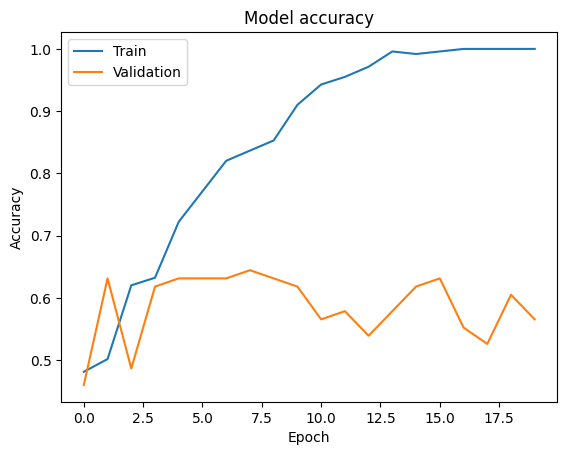

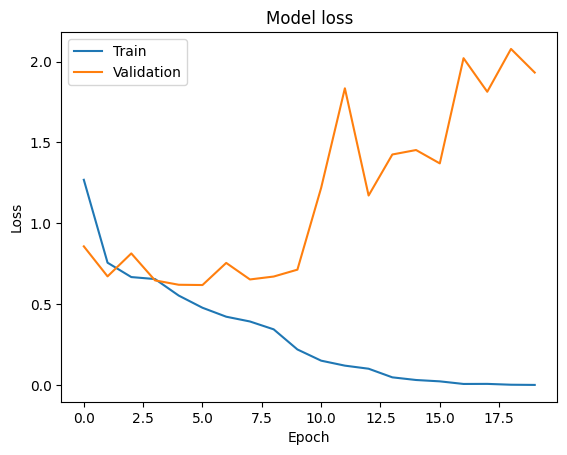

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 112ms/step - accuracy: 1.0000 - loss: 0.0019
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.5658 - loss: 1.9321
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 250ms/step - accuracy: 0.5974 - loss: 2.4568
Training accuracy: 1.0 
Train loss: 0.0019129295833408833
Validation accuracy: 0.5657894611358643 
Val loss: 1.9320770502090454
Test accuracy: 0.5974025726318359 
Test loss: 2.4567530155181885
Results:


/tmp/ipykernel_501/3439147264.py:80: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  results_df = pd.concat([results_df, pd.DataFrame([new_entry])], ignore_index=True)


,Model Name,Test Accuracy,Test Loss,Train Accuracy,Train Loss,Time (s),Epochs,Details
0,cnn_flowers_from_scratch_102.keras,0.597403,2.456753,1.0,0.001913,45.088011,20,False-ep.:20-bs:32


In [29]:
# Set some of the hyperparameters:
do_early_stopping = False
do_tensorboard = True
max_epochs = 20

details = "" # your comment

###############################################
# Define the model architecture:
import keras
from keras import layers
# Define the model architecture
model = get_model()

import datetime
model_name = 'cnn_flowers_from_scratch_102.keras'
model.summary()

# Configure the model:
optimizer = keras.optimizers.Adam(learning_rate = 0.001)  # Adam, RMSProp, SGD
model.compile(optimizer=optimizer,
                  loss= keras.losses.SparseCategoricalCrossentropy(),
                  metrics= [keras.metrics.SparseCategoricalAccuracy("accuracy")])

###############################################
# Define callbacks (e.g., early stopping):
callbacks = []
if do_early_stopping:
    from keras.callbacks import EarlyStopping
    early_stopping = EarlyStopping(monitor="val_loss", patience=3, restore_best_weights=True)
    callbacks.append(early_stopping)
if do_tensorboard:
    from keras.callbacks import TensorBoard
    tensorboard_callback = TensorBoard(log_dir="./logs_flowers/"+model_name, histogram_freq=1, write_steps_per_second=True)
    callbacks.append(tensorboard_callback)

################################################
# Train the model
import time
start_time = time.time()
history = model.fit(train_dataset, epochs=max_epochs,
                    validation_data=validation_dataset,
                    callbacks=callbacks)
time_fit = time.time() - start_time

###############################
# Plot the training progress:
plot_history(history)

# Evaluate the model on the training, validation and test sets
train_loss, train_acc = model.evaluate(train_dataset)
val_loss, val_acc = model.evaluate(validation_dataset)
test_loss, test_acc = model.evaluate(test_dataset)

print('Training accuracy:', train_acc, '\nTrain loss:', train_loss)
print('Validation accuracy:', val_acc, '\nVal loss:', val_loss)
print('Test accuracy:', test_acc, '\nTest loss:', test_loss)

###############################
# Save the model:
import os
model_dir = "./models/"
if not os.path.exists(model_dir):
    os.makedirs(model_dir)
model.save(model_dir + model_name)

#################################
# Add results to the dataframe:
model_details = f"{do_early_stopping}-ep.:{max_epochs}-bs:{batch_size} {details}"
new_entry = {
    "Model Name" : model_name,
    "Details" : model_details,
    "Test Accuracy" : test_acc,
    "Test Loss" : test_loss,
    "Train Accuracy" : train_acc,
    "Train Loss" : train_loss,
    "Time (s)" : time_fit,
    "Epochs" : len(history.epoch),
}
results_df = pd.concat([results_df, pd.DataFrame([new_entry])], ignore_index=True)
# View and and save the dataframe:
results_df.to_csv(model_dir + "mnist_results.csv", index=False)
print("Results:")
display(results_df)

## Confusion matrix and some misclassified images

Number of misclassified images: 64 out of 153 , accuracy: 0.5817


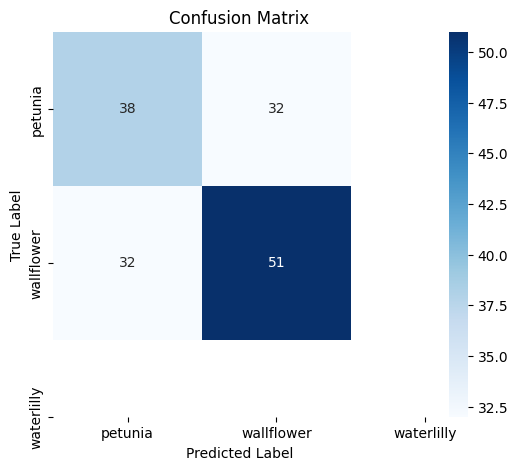

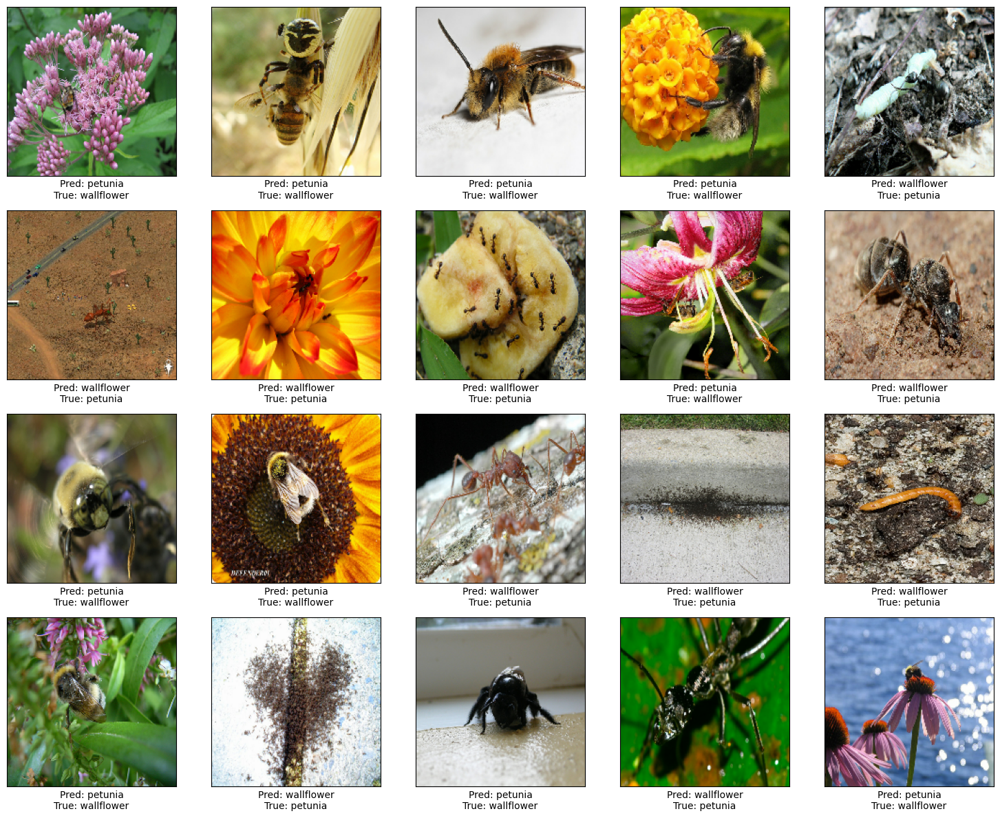

In [30]:
def do_plot_confusion_matrix(model, dataset, num_classes):
    import random
    import numpy as np
    import matplotlib.pyplot as plt
    import seaborn as sns
    from sklearn.metrics import confusion_matrix
    import tensorflow as tf
    label_to_name = list(selected_classes.values())
    label_mapping = {i: name for i, name in enumerate(label_to_name)}

    y_true = []
    y_pred = []
    misclassified_images = []
    misclassified_labels = []
    misclassified_predictions = []

    # Predict and collect results
    for images, labels in plot_dataset:
        preds = model.predict(images, verbose=False)
        preds = np.argmax(preds, axis=1)
        labels_np = labels.numpy()
        images_np = images.numpy()

        y_true.extend(labels_np)
        y_pred.extend(preds)

        for i in range(len(images)):
            if preds[i] != labels_np[i]:
                misclassified_images.append(images_np[i])
                misclassified_labels.append(labels_np[i])
                misclassified_predictions.append(int(preds[i]))

    # Convert to arrays
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    misclassified_images = np.array(misclassified_images)
    misclassified_labels = np.array(misclassified_labels)
    misclassified_predictions = np.array(misclassified_predictions)

    # Accuracy
    misclassified_indices = np.where(y_pred != y_true)[0]
    num_misclassified = len(misclassified_indices)
    test_acc = (len(y_true) - num_misclassified) / len(y_true)
    print("Number of misclassified images:", num_misclassified,
          "out of", len(y_true), ", accuracy:", round(test_acc, 4))

    # Confusion matrix
    cm = confusion_matrix(y_true, y_pred)

    figsize=(6, 5)
    if num_classes >= 10:
        figsize = (60, 50)
    plt.figure(figsize=figsize)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=label_to_name, yticklabels=label_to_name)
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.title('Confusion Matrix')
    plt.show()

    # Show misclassified images with names
    num_images_to_plot = 20
    random_indices = random.sample(range(len(misclassified_images)), min(num_images_to_plot, len(misclassified_images)))

    plt.figure(figsize=(15, 12))
    for i, index in enumerate(random_indices):
        true_label = label_mapping[misclassified_labels[index]]
        pred_label = label_mapping[misclassified_predictions[index]]

        plt.subplot(4, 5, i + 1)
        plt.xticks([])
        plt.yticks([])
        plt.grid(False)
        plt.imshow(misclassified_images[index].astype("uint8"))
        plt.xlabel(f"Pred: {pred_label}\nTrue: {true_label}")
    plt.tight_layout()
    plt.show()

plot_dataset = validation_dataset.concatenate(test_dataset)
do_plot_confusion_matrix(model, plot_dataset, num_classes)

## Visualizations

In [18]:
model.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 180, 180, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling_2 (Rescaling)         │ (None, 180, 180, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 178, 178, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 89, 89, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 87, 87, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 43, 43, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 41, 41, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (None, 20, 20, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 51200)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 64)             │     3,276,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 3)              │           195 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 10,110,923 (38.57 MB)

 Trainable params: 3,370,307 (12.86 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,740,616 (25.71 MB)

### Filters

Shape of weights: (3, 3, 64, 128)


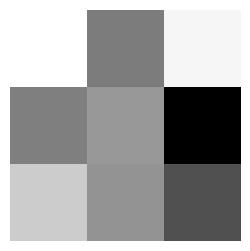

In [19]:
import matplotlib.pyplot as plt
layer_index =   6 # 2     or 4     or 6
channel_index = 0 # 0-3   or 0-31  or 0-63
filter_index =  0 # 0-31  or 0-63  or 0-128


conv_layer = model.layers[layer_index]
weights, biases = conv_layer.get_weights()

print("Shape of weights:", weights.shape)  # (3, 3, 3, 32) for the first conv. layer # (3, 3, 32, 64) for the second conv. layer # (3, 3, 64, 128) for the third conv. layer

# Vizualize the filter:
channel_index = 0
filter = weights[:, :, channel_index, filter_index]
plt.figure(figsize=(3, 3))
plt.imshow(filter, cmap='gray')
plt.axis('off')
plt.show()


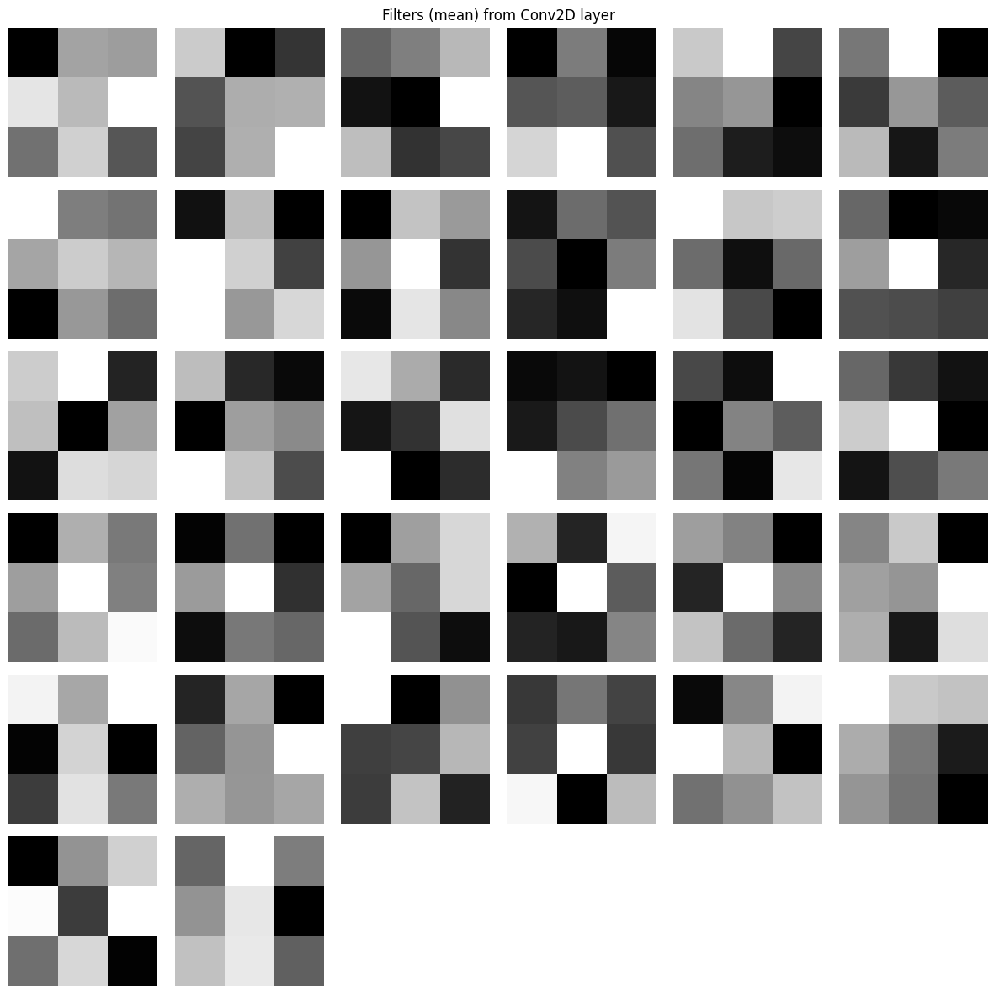

In [20]:
def visualize_filters(conv_layer, mode="first"):
    """
    Visualize learned filters (weights) of a Conv2D layer.

    Parameters:
    - conv_layer: Keras Conv2D layer
    - mode: "first" (only first input channel),
            "all" (all channels per filter in separate figures),
            "mean" (average over input channels per filter)
    """
    import matplotlib.pyplot as plt
    import numpy as np
    import math

    weights, biases = conv_layer.get_weights()
    kernel_height, kernel_width, input_channels, output_channels = weights.shape

    def get_grid_dims(n):
        cols = math.ceil(math.sqrt(n))
        rows = math.ceil(n / cols)
        return rows, cols

    if mode in ["first", "mean"]:
        rows, cols = get_grid_dims(output_channels)
        fig, axs = plt.subplots(rows, cols, figsize=(cols * 2, rows * 2))
        axs = axs.flatten()

        for i in range(output_channels):
            if mode == "first":
                f = weights[:, :, 0, i]
            else:  # mean
                f = np.mean(weights[:, :, :, i], axis=-1)
            axs[i].imshow(f, cmap='gray')
            axs[i].axis('off')

        for j in range(output_channels, len(axs)):
            axs[j].axis('off')

        plt.suptitle(f"Filters ({mode}) from Conv2D layer")
        plt.tight_layout()
        plt.show()

    elif mode == "all":
        for i in range(output_channels):
            fig, axs = plt.subplots(1, input_channels, figsize=(input_channels * 2, 2))
            for j in range(input_channels):
                ax = axs[j] if input_channels > 1 else axs
                f = weights[:, :, j, i]
                ax.imshow(f, cmap='gray')
                ax.set_title(f"In ch. {j}")
                ax.axis('off')
            plt.suptitle(f"Filter {i} (all input channels)")
            plt.tight_layout()
            plt.show()
    else:
        raise ValueError("Unknown mode: choose 'first', 'mean', or 'all'")


# Visualize filters as average of all input channels
visualize_filters(model.layers[2], mode="mean")  # change the layer index: 2, 4, 6

# Visualize filters from the second Conv2D layer (show all input channels)
#visualize_filters(model.layers[2], mode="all")



### Feature maps

In [21]:
image_index = 2
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf

# Get one image from the training set
for image_batch, label_batch in train_dataset.take(1):
    sample_image = image_batch[image_index].numpy()
    break

# Create an intermediate model that outputs activations from all Conv2D layers
layer_outputs = [layer.output for layer in model.layers if isinstance(layer, tf.keras.layers.Conv2D)]
activation_model = tf.keras.models.Model(inputs=model.input, outputs=layer_outputs)

# Run the image through the intermediate model
sample_input = np.expand_dims(sample_image, axis=0)  # Add batch dimension
feature_maps = activation_model.predict(sample_input)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 582ms/step


- for the first conv. layer:

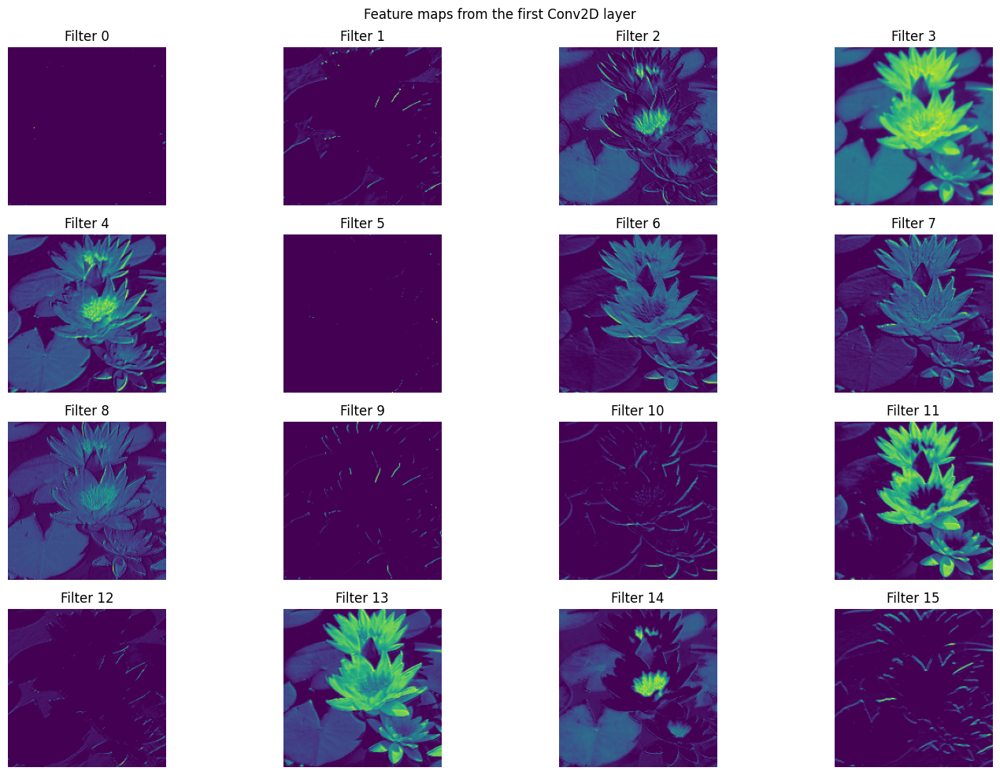

In [22]:
layer_index = 0

# Visualize feature maps from the first Conv2D layer
first_layer_maps = feature_maps[layer_index]  # First layer's activation output

num_filters = first_layer_maps.shape[-1]
size = first_layer_maps.shape[1]

plt.figure(figsize=(15, 10))
for i in range(min(num_filters, 16)):  # Show up to 16 filters
    plt.subplot(4, 4, i + 1)
    plt.imshow(first_layer_maps[0, :, :, i], cmap='viridis')
    plt.axis('off')
    plt.title(f'Filter {i}')
plt.suptitle('Feature maps from the first Conv2D layer')
plt.tight_layout()
plt.show()

- for any conv. layer:

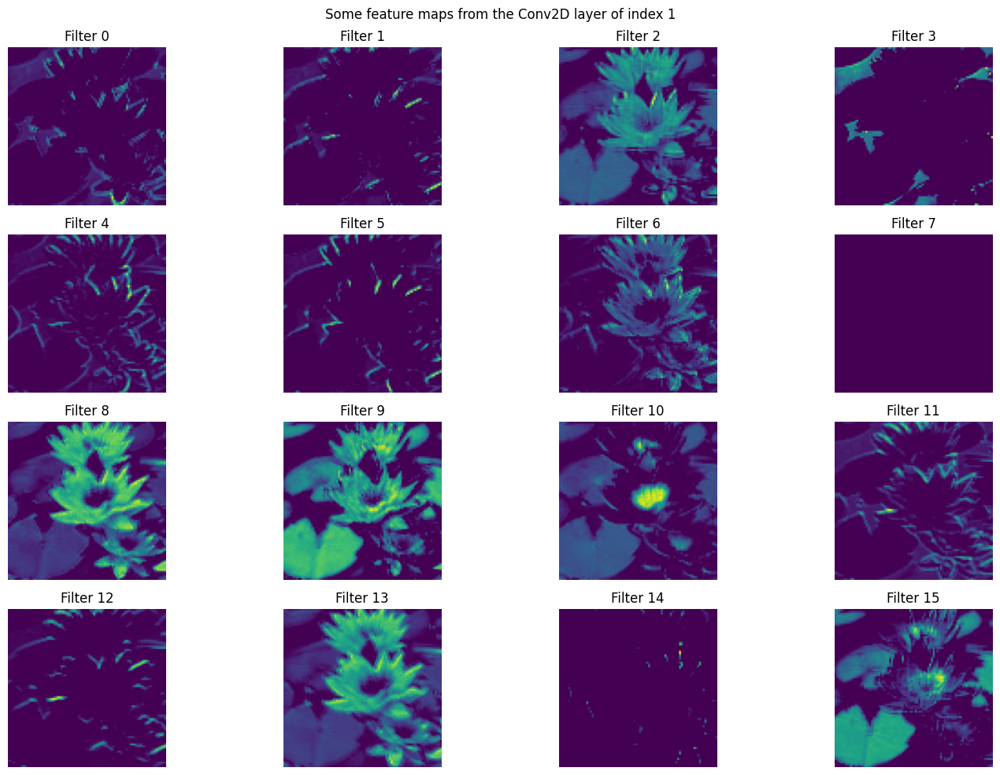

In [ ]:
layer_index = 1 # 0, 1, 2

# Visualize feature maps from the first Conv2D layer
first_layer_maps = feature_maps[layer_index]  # First layer's activation output

num_filters = first_layer_maps.shape[-1]
size = first_layer_maps.shape[1]

plt.figure(figsize=(15, 10))
for i in range(min(num_filters, 16)):  # Show up to 16 filters
    plt.subplot(4, 4, i + 1)
    plt.imshow(first_layer_maps[0, :, :, i], cmap='viridis')
    plt.axis('off')
    plt.title(f'Filter {i}')
plt.suptitle(f'Some feature maps from the Conv2D layer of index {layer_index}')
plt.tight_layout()
plt.show()


### Saliency map

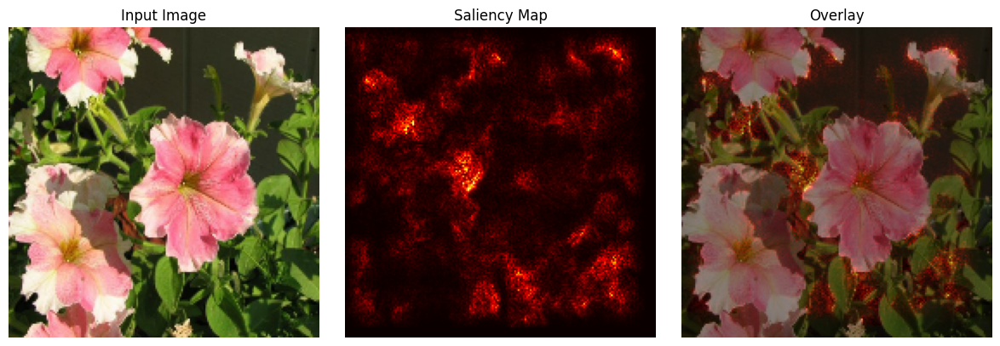

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

def visualize_saliency_map(model, image, label=None):
    """
    Generate a saliency map for an input RGB image,
    showing which pixels most affect the model's decision.
    """
    image_tensor = tf.convert_to_tensor(image[np.newaxis, ...], dtype=tf.float32)

    # Get prediction and inferred label if not provided
    predictions = model.predict(image_tensor, verbose=0)
    if label is None:
        label = tf.argmax(predictions[0])

    with tf.GradientTape() as tape:
        tape.watch(image_tensor)
        preds = model(image_tensor)
        loss = preds[:, label]

    # Compute gradient of the output w.r.t. input image
    gradient = tape.gradient(loss, image_tensor)[0]

    # Saliency map: absolute max gradient across channels
    saliency = tf.reduce_max(tf.abs(gradient), axis=-1)

    # Normalize saliency to [0, 1]
    saliency = (saliency - tf.reduce_min(saliency)) / (tf.reduce_max(saliency) - tf.reduce_min(saliency) + 1e-8)
    saliency = saliency.numpy()

    # Convert image to displayable format if needed
    if image.max() <= 1.0:
        image_display = (image * 255).astype("uint8")
    else:
        image_display = image.astype("uint8")

    # Plotting
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.title("Input Image")
    plt.imshow(image_display)
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.title("Saliency Map")
    plt.imshow(saliency, cmap='hot')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.title("Overlay")
    plt.imshow(image_display)
    plt.imshow(saliency, cmap='hot', alpha=0.5)
    plt.axis('off')

    plt.tight_layout()
    plt.show()


image_index = 20
# Get one image from the dataset
for images, labels in train_dataset.take(1):
    image = images[image_index].numpy()
    label = labels[image_index].numpy()
    break



# Call the saliency map function
visualize_saliency_map(model, image, label)

# Exercise
- finetune the architecture and hyperparameters and observe the results
- observe the features extracted from the data
- what is the accuracy of the final model?


# Training with data augmentation and regularization

## Define a data augmentation layer:

In [ ]:
data_augmentation = keras.Sequential(
    [
            layers.RandomFlip("horizontal"),
            layers.RandomRotation(0.1),
            layers.RandomZoom(0.2),
            layers.RandomContrast(0.1),
            layers.RandomBrightness(0.1),
            layers.RandomTranslation(0.1, 0.1),
    ]
)

- display some randomly augmented training images

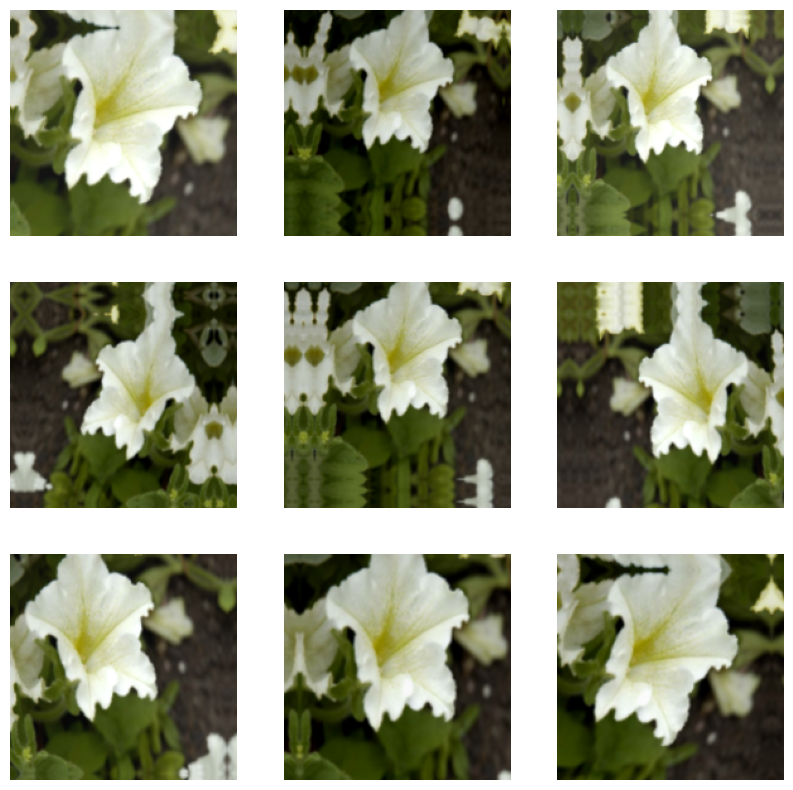

In [ ]:
plt.figure(figsize=(10, 10))
for images, _ in train_dataset.take(1):
    for i in range(9):
        augmented_images = data_augmentation(images)
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(augmented_images[0].numpy().astype("uint8"))
        plt.axis("off")

## Data augmentation + dropout:
- define the regularized model:

In [ ]:
data_augmentation = keras.Sequential(
    [
            layers.RandomFlip("horizontal"),
            layers.RandomRotation(0.1),
            layers.RandomZoom(0.2),
            layers.RandomContrast(0.1),
            layers.RandomBrightness(0.1),
            layers.RandomTranslation(0.1, 0.1),
    ]
)

def get_regularized_model(num_classes):
      import keras
      from keras import layers
      # Define the model architecture
      inputs = keras.Input(shape=image_size + (3, ))

      # Augment the data
      x = data_augmentation(inputs)             # NEW

      # Normalize pixels
      x = layers.Rescaling(1./255)(x)

      # Convolutional blocks
      x = layers.Conv2D(filters=32, kernel_size=3, activation="relu")(x)
      x = layers.MaxPooling2D(pool_size=2)(x)

      x = layers.Conv2D(filters=64, kernel_size=3, activation="relu")(x)
      x = layers.MaxPooling2D(pool_size=2)(x)

      x = layers.Conv2D(filters=128, kernel_size=3, activation="relu")(x)
      x = layers.MaxPooling2D(pool_size=2)(x)

      #x = layers.Conv2D(filters=256, kernel_size=3, activation="relu")(x)

      x = layers.Flatten()(x)

      # Dense layers
      x = layers.Dense(64, activation='relu')(x)
      x = layers.Dropout(0.3)(x)                # NEW

      # Output layer for 3-class classification
      outputs = layers.Dense(num_classes, activation="sigmoid")(x)

      # Build model
      model = keras.Model(inputs=inputs, outputs=outputs)
      return model

model = get_regularized_model(num_classes)
model.summary()

Model: "functional_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_4 (InputLayer)      │ (None, 180, 180, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_2 (Sequential)       │ (None, 180, 180, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling_3 (Rescaling)         │ (None, 180, 180, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 178, 178, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_9 (MaxPooling2D)  │ (None, 89, 89, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, 87, 87, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_10 (MaxPooling2D) │ (None, 43, 43, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 41, 41, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_11 (MaxPooling2D) │ (None, 20, 20, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_3 (Flatten)             │ (None, 51200)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 64)             │     3,276,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 3)              │           195 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,370,307 (12.86 MB)

 Trainable params: 3,370,307 (12.86 MB)

 Non-trainable params: 0 (0.00 B)

### Train

Model: "functional_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_6 (InputLayer)      │ (None, 180, 180, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_2 (Sequential)       │ (None, 180, 180, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling_4 (Rescaling)         │ (None, 180, 180, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_12 (Conv2D)              │ (None, 178, 178, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_12 (MaxPooling2D) │ (None, 89, 89, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_13 (Conv2D)              │ (None, 87, 87, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_13 (MaxPooling2D) │ (None, 43, 43, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_14 (Conv2D)              │ (None, 41, 41, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_14 (MaxPooling2D) │ (None, 20, 20, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_4 (Flatten)             │ (None, 51200)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 64)             │     3,276,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 3)              │           195 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,370,307 (12.86 MB)

 Trainable params: 3,370,307 (12.86 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/40
15/15 ━━━━━━━━━━━━━━━━━━━━ 13s 308ms/step - accuracy: 0.5155 - loss: 1.0277 - val_accuracy: 0.5417 - val_loss: 0.9191
Epoch 2/40
15/15 ━━━━━━━━━━━━━━━━━━━━ 3s 168ms/step - accuracy: 0.6836 - loss: 0.6722 - val_accuracy: 0.8125 - val_loss: 0.4872
Epoch 3/40
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 140ms/step - accuracy: 0.7412 - loss: 0.5389 - val_accuracy: 0.8125 - val_loss: 0.4091
Epoch 4/40
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 114ms/step - accuracy: 0.7810 - loss: 0.4887 - val_accuracy: 0.8542 - val_loss: 0.3747
Epoch 5/40
15/15 ━━━━━━━━━━━━━━━━━━━━ 3s 174ms/step - accuracy: 0.8363 - loss: 0.4157 - val_accuracy: 0.8542 - val_loss: 0.2993
Epoch 6/40
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - accuracy: 0.8407 - loss: 0.4089 - val_accuracy: 0.8542 - val_loss: 0.3347
Epoch 7/40
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 109ms/step - accuracy: 0.8473 - loss: 0.3424 - val_accuracy: 0.8958 - val_loss: 0.2510
Epoch 8/40
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 112ms/step - accuracy: 0.8872 - loss: 0.3100 - val_accuracy: 0

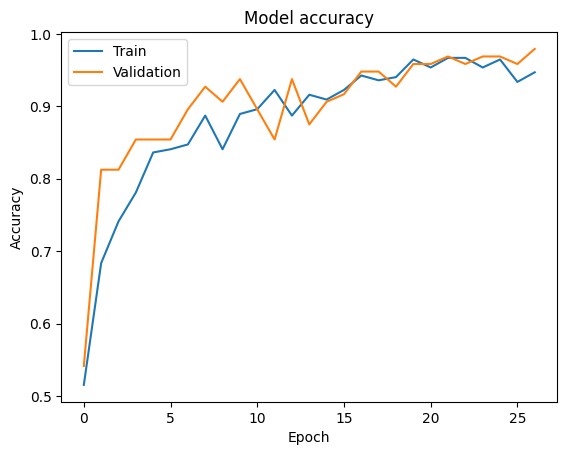

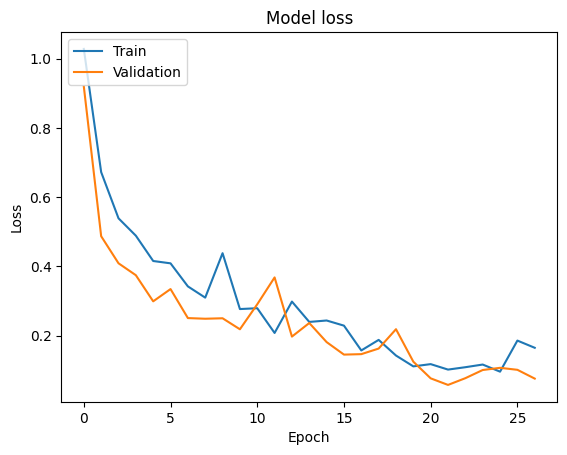

15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - accuracy: 0.9912 - loss: 0.0258
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - accuracy: 0.9688 - loss: 0.0581
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - accuracy: 0.9900 - loss: 0.0364
Training accuracy: 0.991150438785553 
Train loss: 0.02584194578230381
Validation accuracy: 0.96875 
Val loss: 0.058051902800798416
Test accuracy: 0.9900000095367432 
Test loss: 0.03638158738613129
Results:


,Model Name,Test Accuracy,Test Loss,Train Accuracy,Train Loss,Time (s),Epochs,Details
0,cnn_flowers_from_scratch_102.keras,0.95,0.249634,1.00000,0.000164,56.859846,20,False-ep.:20-bs:32
1,cnn_flowers_20260415-214905.keras,0.99,0.036382,0.99115,0.025842,65.779806,27,True-ep.:40-bs:32


In [ ]:
# Set some of the hyperparameters:
do_early_stopping = True
do_tensorboard = True
max_epochs = 40

details = "" # your comment

###############################################
# Define the model architecture:
import keras
from keras import layers
# Define the model architecture
model = get_regularized_model(num_classes)

import datetime
model_name = "cnn_flowers_" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S") + '.keras'
model.summary()

# Configure the model:
optimizer = keras.optimizers.Adam(learning_rate = 0.001)  # Adam, RMSProp, SGD
model.compile(optimizer=optimizer,
                  loss= keras.losses.SparseCategoricalCrossentropy(),
                  metrics= [keras.metrics.SparseCategoricalAccuracy("accuracy")])

###############################################
# Define callbacks (e.g., early stopping):
callbacks = []
if do_early_stopping:
    from keras.callbacks import EarlyStopping
    early_stopping = EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True)
    callbacks.append(early_stopping)
if do_tensorboard:
    from keras.callbacks import TensorBoard
    tensorboard_callback = TensorBoard(log_dir="./logs_flowers/"+model_name, histogram_freq=1, write_steps_per_second=True)
    callbacks.append(tensorboard_callback)

################################################
# Train the model
import time
start_time = time.time()
history = model.fit(train_dataset, epochs=max_epochs, batch_size=batch_size,
                    validation_data=validation_dataset,
                    callbacks=callbacks)
time_fit = time.time() - start_time

###############################
# Plot the training progress:
plot_history(history)

# Evaluate the model on the training, validation and test sets
train_loss, train_acc = model.evaluate(train_dataset)
val_loss, val_acc = model.evaluate(validation_dataset)
test_loss, test_acc = model.evaluate(test_dataset)

print('Training accuracy:', train_acc, '\nTrain loss:', train_loss)
print('Validation accuracy:', val_acc, '\nVal loss:', val_loss)
print('Test accuracy:', test_acc, '\nTest loss:', test_loss)

###############################
# Save the model:
import os
model_dir = "./models/"
if not os.path.exists(model_dir):
    os.makedirs(model_dir)
model.save(model_dir + model_name)

#################################
# Add results to the dataframe:
model_details = f"{do_early_stopping}-ep.:{max_epochs}-bs:{batch_size} {details}"
new_entry = {
    "Model Name" : model_name,
    "Details" : model_details,
    "Test Accuracy" : test_acc,
    "Test Loss" : test_loss,
    "Train Accuracy" : train_acc,
    "Train Loss" : train_loss,
    "Time (s)" : time_fit,
    "Epochs" : len(history.epoch),
}
results_df = pd.concat([results_df, pd.DataFrame([new_entry])], ignore_index=True)
# View and and save the dataframe:
results_df.to_csv(model_dir + "mnist_results.csv", index=False)
print("Results:")
display(results_df)

Number of misclassified images: 4 out of 196 , accuracy: 0.9796


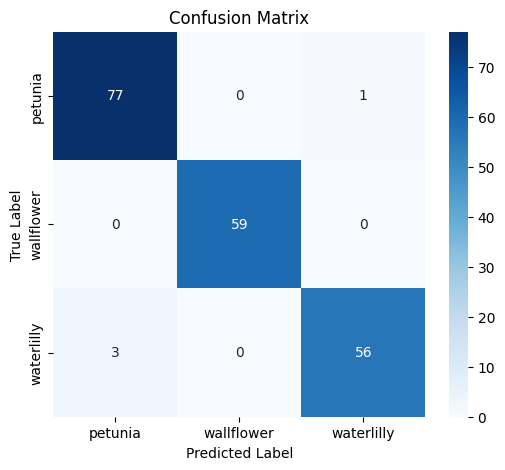

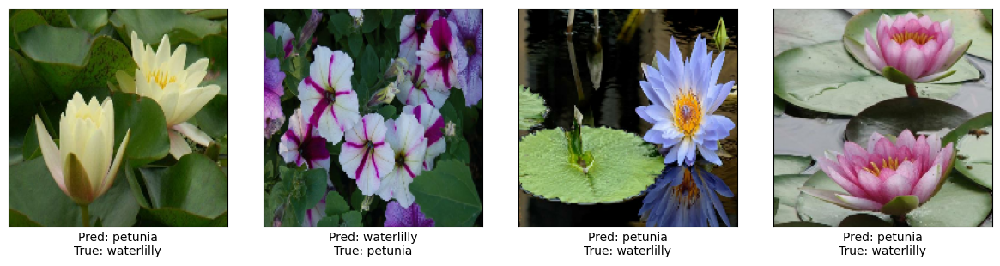

In [ ]:
plot_dataset = validation_dataset.concatenate(test_dataset)
do_plot_confusion_matrix(model, plot_dataset, num_classes)

## Bath normalization

In [ ]:
def get_batch_normalized_model(num_classes):
      import keras
      from keras import layers
      # Define the model architecture
      inputs = keras.Input(shape=image_size + (3, ))

      # Augment the data
      x = data_augmentation(inputs)

      # Normalize pixels
      x = layers.Rescaling(1./255)(x)

      # Convolutional blocks
      x = layers.Conv2D(32, kernel_size=3, use_bias = False)(x)
      x = layers.BatchNormalization()(x)  # Add batch normalization
      x = layers.Activation('relu')(x)
      x = layers.MaxPooling2D(pool_size=2)(x)

      x = layers.Conv2D(64, kernel_size=3, use_bias = False)(x)
      x = layers.BatchNormalization()(x)  # Add batch normalization
      x = layers.Activation('relu')(x)
      x = layers.MaxPooling2D(pool_size=2)(x)

      x = layers.Conv2D(128, kernel_size=3, use_bias = False)(x)
      #x = layers.BatchNormalization()(x)  # Add batch normalization
      x = layers.Activation('relu')(x)
      x = layers.MaxPooling2D(pool_size=2)(x)

      #x = layers.Conv2D(filters=256, kernel_size=3, activation="relu")(x) ...

      x = layers.Flatten()(x)

      # Dense layers
      x = layers.Dense(64, activation='relu')(x)
      #x = layers.Dropout(0.3)(x)

      # Output layer for 3-class classification
      outputs = layers.Dense(num_classes, activation="sigmoid")(x)

      # Build model
      model = keras.Model(inputs=inputs, outputs=outputs)
      return model

model = get_batch_normalized_model(num_classes)
model.summary()

Model: "functional_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_7 (InputLayer)      │ (None, 180, 180, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_2 (Sequential)       │ (None, 180, 180, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling_5 (Rescaling)         │ (None, 180, 180, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_15 (Conv2D)              │ (None, 178, 178, 32)   │           864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 178, 178, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 178, 178, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_15 (MaxPooling2D) │ (None, 89, 89, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_16 (Conv2D)              │ (None, 87, 87, 64)     │        18,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 87, 87, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_1 (Activation)       │ (None, 87, 87, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_16 (MaxPooling2D) │ (None, 43, 43, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_17 (Conv2D)              │ (None, 41, 41, 128)    │        73,728 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_2 (Activation)       │ (None, 41, 41, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_17 (MaxPooling2D) │ (None, 20, 20, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_5 (Flatten)             │ (None, 51200)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 64)             │     3,276,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 3)              │           195 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,370,467 (12.86 MB)

 Trainable params: 3,370,275 (12.86 MB)

 Non-trainable params: 192 (768.00 B)

### Train:

Model: "functional_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_8 (InputLayer)      │ (None, 180, 180, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_2 (Sequential)       │ (None, 180, 180, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling_6 (Rescaling)         │ (None, 180, 180, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_18 (Conv2D)              │ (None, 178, 178, 32)   │           864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 178, 178, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_3 (Activation)       │ (None, 178, 178, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_18 (MaxPooling2D) │ (None, 89, 89, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_19 (Conv2D)              │ (None, 87, 87, 64)     │        18,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 87, 87, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_4 (Activation)       │ (None, 87, 87, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_19 (MaxPooling2D) │ (None, 43, 43, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_20 (Conv2D)              │ (None, 41, 41, 128)    │        73,728 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_5 (Activation)       │ (None, 41, 41, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_20 (MaxPooling2D) │ (None, 20, 20, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_6 (Flatten)             │ (None, 51200)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 64)             │     3,276,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 3)              │           195 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,370,467 (12.86 MB)

 Trainable params: 3,370,275 (12.86 MB)

 Non-trainable params: 192 (768.00 B)

Epoch 1/20
15/15 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - accuracy: 0.5354 - loss: 0.9217 - val_accuracy: 0.3958 - val_loss: 1.0545
Epoch 2/20
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - accuracy: 0.7146 - loss: 0.6293 - val_accuracy: 0.5521 - val_loss: 1.0219
Epoch 3/20
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - accuracy: 0.8031 - loss: 0.4817 - val_accuracy: 0.7708 - val_loss: 0.9868
Epoch 4/20
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - accuracy: 0.8252 - loss: 0.4357 - val_accuracy: 0.7188 - val_loss: 0.9554
Epoch 5/20
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 151ms/step - accuracy: 0.8341 - loss: 0.4421 - val_accuracy: 0.7188 - val_loss: 0.9273
Epoch 6/20
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - accuracy: 0.8319 - loss: 0.3957 - val_accuracy: 0.6667 - val_loss: 0.9134
Epoch 7/20
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - accuracy: 0.8606 - loss: 0.3499 - val_accuracy: 0.6562 - val_loss: 0.8998
Epoch 8/20
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 143ms/step - accuracy: 0.8606 - loss: 0.3569 - val_accuracy: 0.

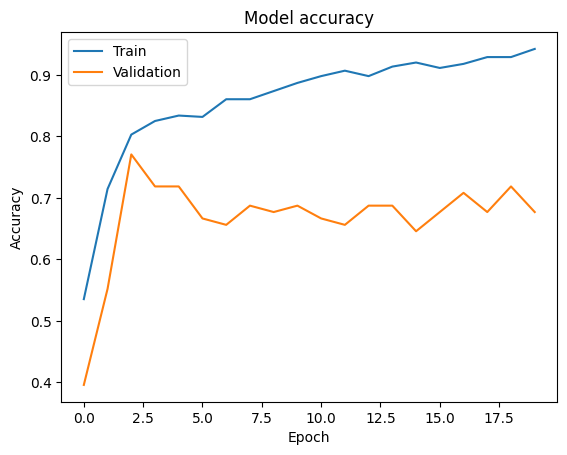

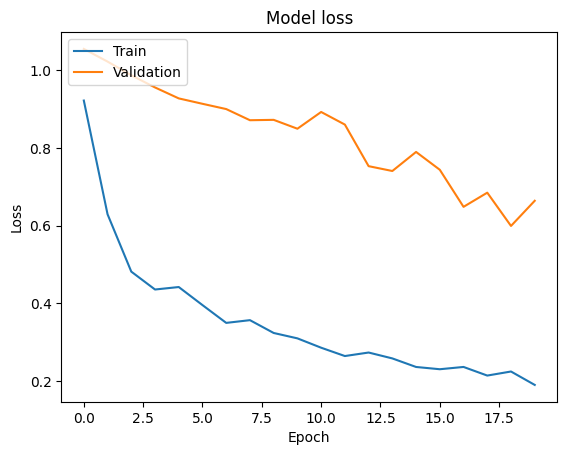

15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - accuracy: 0.7345 - loss: 0.5691
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - accuracy: 0.7188 - loss: 0.5992
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - accuracy: 0.7300 - loss: 0.5459
Training accuracy: 0.7345132827758789 
Train loss: 0.5690924525260925
Validation accuracy: 0.71875 
Val loss: 0.599238395690918
Test accuracy: 0.7300000190734863 
Test loss: 0.5458887219429016
Results:


,Model Name,Test Accuracy,Test Loss,Train Accuracy,Train Loss,Time (s),Epochs,Details
0,cnn_flowers_from_scratch_102.keras,0.95,0.249634,1.000000,0.000164,56.859846,20,False-ep.:20-bs:32
1,cnn_flowers_20260415-214905.keras,0.99,0.036382,0.991150,0.025842,65.779806,27,True-ep.:40-bs:32
2,cnn_flowers_20260415-215014.keras,0.73,0.545889,0.734513,0.569092,49.784533,20,True-ep.:20-bs:32


In [ ]:
# Set some of the hyperparameters:
do_early_stopping = True
do_tensorboard = True
max_epochs = 20
learning_rate = 0.00001 # BN ... SMALLER LEARNING RATE
details = "" # your comment

###############################################
# Define the model architecture:
import keras
from keras import layers
# Define the model architecture
model = get_batch_normalized_model(num_classes)

import datetime
model_name = "cnn_flowers_" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S") + '.keras'
model.summary()

# Configure the model:
optimizer = keras.optimizers.Adam(learning_rate = learning_rate)  # Adam, RMSProp, SGD
model.compile(optimizer=optimizer,
                  loss= keras.losses.SparseCategoricalCrossentropy(),
                  metrics= [keras.metrics.SparseCategoricalAccuracy("accuracy")])

###############################################
# Define callbacks (e.g., early stopping):
callbacks = []
if do_early_stopping:
    from keras.callbacks import EarlyStopping
    early_stopping = EarlyStopping(monitor="val_loss", patience=3, restore_best_weights=True)
    callbacks.append(early_stopping)
if do_tensorboard:
    from keras.callbacks import TensorBoard
    tensorboard_callback = TensorBoard(log_dir="./logs_flowers/"+model_name, histogram_freq=1, write_steps_per_second=True)
    callbacks.append(tensorboard_callback)

################################################
# Train the model
import time
start_time = time.time()
history = model.fit(train_dataset, epochs=max_epochs, batch_size=batch_size,
                    validation_data=validation_dataset,
                    callbacks=callbacks)
time_fit = time.time() - start_time

###############################
# Plot the training progress:
plot_history(history)

# Evaluate the model on the training, validation and test sets
train_loss, train_acc = model.evaluate(train_dataset)
val_loss, val_acc = model.evaluate(validation_dataset)
test_loss, test_acc = model.evaluate(test_dataset)

print('Training accuracy:', train_acc, '\nTrain loss:', train_loss)
print('Validation accuracy:', val_acc, '\nVal loss:', val_loss)
print('Test accuracy:', test_acc, '\nTest loss:', test_loss)

###############################
# Save the model:
import os
model_dir = "./models/"
if not os.path.exists(model_dir):
    os.makedirs(model_dir)
model.save(model_dir + model_name)

#################################
# Add results to the dataframe:
model_details = f"{do_early_stopping}-ep.:{max_epochs}-bs:{batch_size} {details}"
new_entry = {
    "Model Name" : model_name,
    "Details" : model_details,
    "Test Accuracy" : test_acc,
    "Test Loss" : test_loss,
    "Train Accuracy" : train_acc,
    "Train Loss" : train_loss,
    "Time (s)" : time_fit,
    "Epochs" : len(history.epoch),
}
results_df = pd.concat([results_df, pd.DataFrame([new_entry])], ignore_index=True)
# View and and save the dataframe:
results_df.to_csv(model_dir + "mnist_results.csv", index=False)
print("Results:")
display(results_df)

Number of misclassified images: 54 out of 196 , accuracy: 0.7245


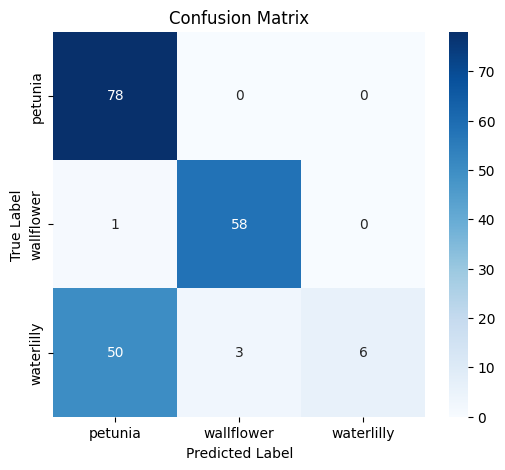

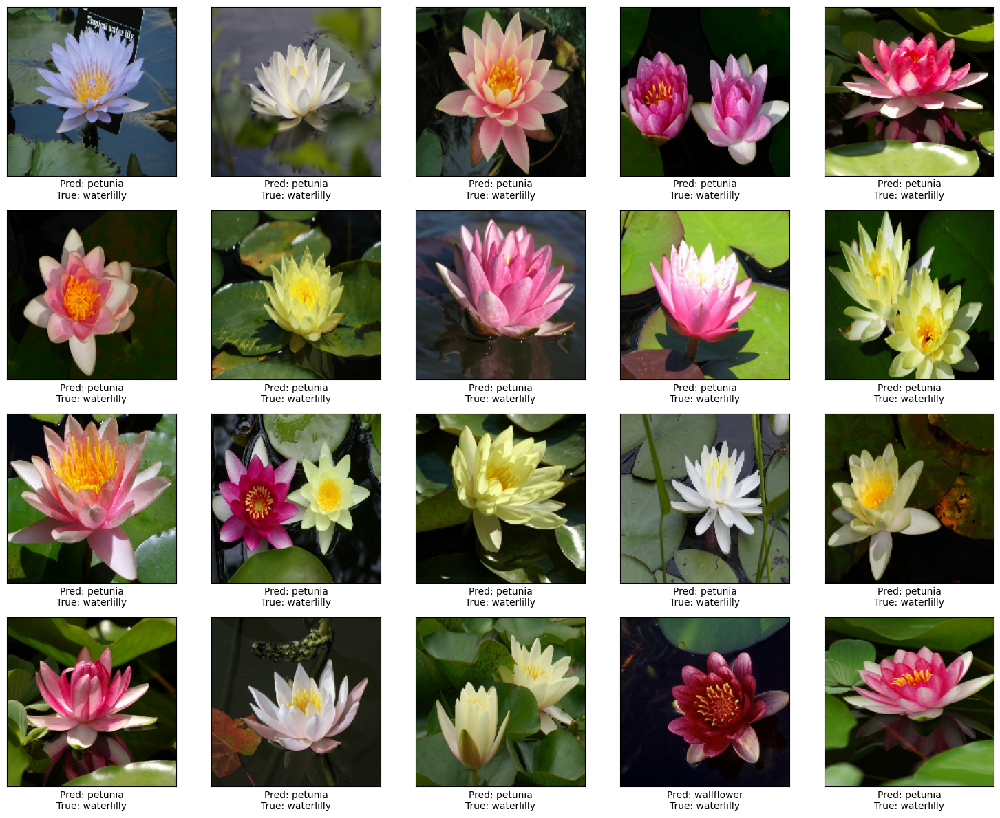

In [ ]:
plot_dataset = validation_dataset.concatenate(test_dataset)
do_plot_confusion_matrix(model, plot_dataset, num_classes)

## Observation
- Both the simple and regularized model are able to learn the **classfification into three classes** task quite well.
- Regularization (early stoppping, dropout and data augmentation) improves the loss and accuracy of the model significantly
- The model generalizes poorly if we classify into 102 classes.




In [ ]:
###############################################
# Load TensorBoard notebook extension
%load_ext tensorboard

# Start TensorBoard before training begins
%tensorboard --logdir logs_flowers --reload_interval=1

<IPython.core.display.Javascript object>